# 2-7. 프로젝트: ResNet Ablation Study

### 목차

#### 0. (사전학습) ResNet 논문 내용 요약
#### 1. ResNet 기본 블록 구성하기
#### 2. ResNet-34, ResNet-50 Complete Model
#### 3. 일반 네트워크(plain network) 만들기
#### 4. ResNet-50 vs Plain-50 또는 ResNet-34 vs Plain-34
#### 5. 루브릭 & 회고 & References

### 0. (사전학습) ResNet 논문 내용 요약

#### 1. Abstract

본 논문에서는 Deep Network를 학습시키기 위한 방법으로 Residual Learning를 제안 했습니다.

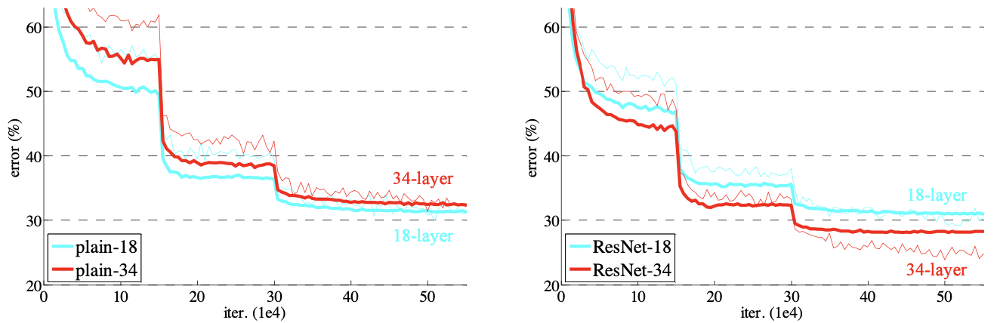

일반적으로 Plain CNN 에서는 Deeper layer에서 error 가 높아지는 것을 볼 수가 있는 반면에,

ResNet을 적용한 CNN 에서는 Deeper layer 임에도 error 가 낮아지는 것을 보여주었습니다.

visual recognition task에서 Network depth는 매우 중요한 요소입니다.

하지만, Deeper layer 에서 발생하는 Vanishing Gradient, Overfitting 등의 문제도 같이 따라오는데,

본 논문에서는 이것을 **Residul learining** 이 문제를 해결해 주었습니다.

여기서 residual learning이란 이전 layer의 결과를 다시 이용하여 합치는 것이라고 볼 수 있는데요.

즉, 입력 layer 를 다시 이용하는 residual funcion을 사용하여 더 쉬운 최적화와 깊은 네트워크에서의 정확도 향상이 가능했다고 저자들은 말했습니다.

또한, 결과적으로 저자들은 ResNet을 이용해서 VGGNet의 8배인 152 layer를 사용하였으며, 앙상블 기법을 적용해 오차를 3.75% 까지 낮추면서 ILSVRC & COCO 2015 competitions 에서 우승을 했다고 합니다.

#### 2. Introduction

Resnet 전까지의 연구결과에 따르면 Network depth는 매우 중요한데, 실제로 많은 모델들이 깊은 네트워크를 통해 좋은 성능을 보였다고 합니다.

하지만, Network depth가 중요해지면서, layer를 쌓는 만큼 더 쉽게 네트워크를 학습시킬 수 있는지에 대한 의문이 생기기 시작했고, 
특히 그 중에서도 Vanishing / Exploding gradient 현상이 큰 방해 요소였습니다.

다행히도 SGD를 적용한 10개의 Layer까지는 normalization 기법과 Batch normalization과 같은 intermediate normalization layer를 사용했을 경우, 문제를 해결할 수 있었다고 합니다.

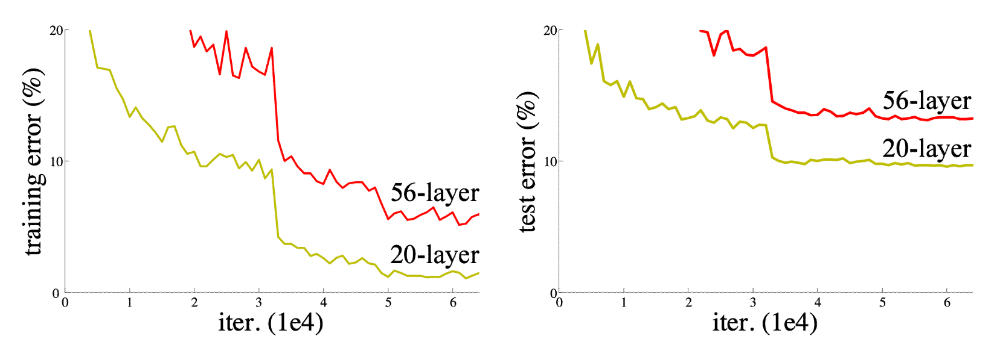

하지만 심층 신경망의 경우, 성능이 최고 수준에 도달할 때 degradation 문제가 발생하였고, 이는 Network depth가 깊어짐에 따라 정확도가 포화하고, 급속하게 감소하는 것을 의미합니다.

이러한 degradation 문제의 원인은 오버 피팅이 아니라, 그저 layer의 수가 더 추가되었기 때문인데 test error 만이 아닌, training error도 함께 높아졌기 때문입니다. 또한 이는 서로 다른 system들이 최적화되는 방식이 다르다는 점을 의미합니다.

하지만, deeper layer 모델에서도 제한된 상황에서는 최적화될 수 있는 방법이 있었습니다. 이 방법은 추가된 레이어가 identity mapping이고, 추가되지 않은 다른 레이어들은 더 얕은 모델에서 학습된 layer를 사용하는 것입니다. 이와같이 제한된 상황에서의 deeper layer 모델은 shallower layer 모델보다 더 낮은 training error를 갖으며, 마이크로소프트 팀은 이 개념을 모델에 적용하였습니다.

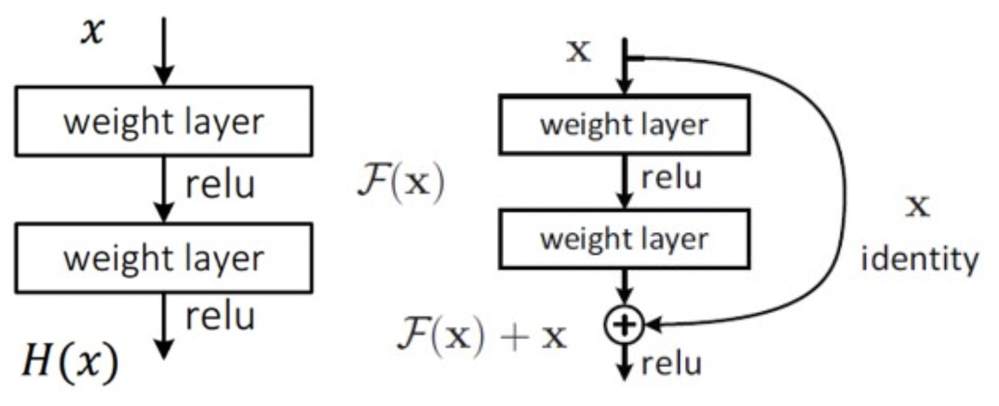

기존 네트워크는 입력 x를 받고 layer를 거쳐 H(x)를 출력하는데, 이는 입력값 x를 타겟값 y로 mapping 하는 함수 H(x)를 얻는 것이 목적입니다.

하지만 ResNet의 Residual Learning은 H(x)가 아닌 출력과 입력의 차인 H(x) - x (`잔차`) 를 얻도록 목표를 수정하였습니다. 따라서 Residual Function인 F(x) = H(x) - x (`잔차`) 를 최소화시켜야 하고 이는 즉, 출력과 입력의 차 (`잔차`)을 줄인다는 의미가 됩니다.

여기서 x의 값은 도중에 바꾸지 못하는 입력 값이므로 F(x)가 0이 되는 것이 최적의 해이고, 결국 0 = H(x) - x로 H(x) = x가 됩니다. 즉, H(x)를 x로 mapping 하는 것이 학습의 목표가 된 것입니다.

이전에는 Unreferenced mapping인 H(x)를 학습시켜야 한다는 점 때문에 어려움이 있었는데, (알지 못하는 최적의 값으로 H(x)를 근사 시켜야 하므로), 이제는 H(x) = x라는 최적의 목표값이 사전에 pre-conditioning으로 제공되기에 Identity mapping이 Identity mapping인 F(x)가 학습이 더 쉬워지는 것입니다.

결과적으로 H(x) = F(x) + x 이므로 네트워크 구조 또한 크게 변경할 필요가 없는데, 단순히 입력에서 출력으로 바로 연결되는 shortcut만 추가하면 되기 때문이다. 또한, 입력과 같은 x가 그대로 출력에 연결되기에 파라미터 수에 영향이 없으며, 덧셈이 늘어나는 것을 제외하면 shortcut 연결을 통한 연산량 증가는 없습니다.

무엇보다도 곱셈 연산에서 덧셈 연산으로 변형되어 몇 개의 layer를 건너뛰는 효과가 있었는데, 이 덕에 forward와 backward path가 단순해지는 효과가 있었으며, gradient의 소멸 문제를 해결할 수 있었다고 합니다.

이 내용을 기반으로 ResNet 구현 과정을 진행해 보도록 하겠습니다.

## 1. ResNet 기본 블록 구성하기
---

본 논문의 핵심 아이디어인 : Residual Block 의 기본 구성은

BasicBlock = Convolution layer + BatchNormalization layer + ReLU 가 쌓여서 만들어진 구성을 가지고 있으며,

이를 통해서 block 한 개를 만들 수 있습니다.

### 1-1. 필요한 모듈 import

In [1]:
# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

# Helper libraries
import numpy as np
import matplotlib.pyplot as plt

import tensorflow_datasets as tfds

In [2]:
# Tensorflow가 활용할 GPU가 장착되어 있는지 확인해 봅니다.
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

### 1-2. ResNet 기본 블록 구현
---

- 입력 인자
    - `input_layer` : 블럭 앞에 존재하는 입력층을 전달
    - `num_cnn` : 블럭 안에 Conv layer 수
    - 그외의 `channel` 수 와 몇 번째 블럭인지 나타내는 `block_num`
    - `is_50` : True == ResNet_50, False = ResNet_34
    - `CHECK_CHANNEL` : function 내부에서 channel이 바뀌면 input의 가로, 세로 사이즈를 줄여주기 위해서 사용하는 변수
    - `plain` : plain net 과 ResNet을 구분하는 변수

In [3]:
# function for building ResNet Block

def build_resnet_block(input_layer,
                    num_cnn=3, 
                    channel=64,
                    block_num=1,
                    is_50=False,
                    CHECK_CHANNEL=64,
                    plain=False,
                   ):

    # print(f'입력받은 shape : {input_layer.shape}')

    flag = CHECK_CHANNEL == channel
    bn = 1
    
    # 입력 레이어
    x = input_layer
    
    # 들어오는 input을 init_identity에 저장시켜 놓는다.
    # 이전 블럭에서 들어오는 정보는 init_identity에서 저장합니다.
    
    init_identity = x

    if not is_50:

        # CNN 레이어
        # 블럭 내부 구성
        for cnn_num in range(num_cnn):
            # 블럭의 첫번째 conv층 쌓기
            # 채널이 바뀌면서 이미지의 가로, 세로 길이가 반으로 줄어야 합니다.
            # for cnn_num in range(num_cnn)을 통해서
            # 블럭 안에서 Shortcut Connection으로 사용할 identity는 여기서 저장합니다.
            identity = x
            
            # flag가 False이면 새로운 Conv Block 쌓아 줍니다.
            # 그러므로 strides=(2,2)를 사용해서 입력이미지의 사이즈를 줄인다.
            if flag :
                # 첫번째 Conv
                x = keras.layers.Conv2D(
                    filters=channel,
                    kernel_size=(3,3),
                    kernel_initializer='he_normal',
                    padding='same',
                    name=f'stage{block_num+2}_{cnn_num+1}_conv1'
                )(x)    
                
            else :
                x = keras.layers.Conv2D(
                    filters=channel,
                    kernel_size=(3,3),
                    kernel_initializer='he_normal',
                    padding='same',
                    strides=(2,2),
                    name=f'stage{block_num+2}_{cnn_num+1}_conv1'
                )(x)
            
            # BatchNormalization layer
            x = keras.layers.BatchNormalization(
                name=f'stage{block_num+2}_{cnn_num+1}_bn{bn}'
            )(x)
            
            # Activation layer 'relu'
            bn += 1
            x = keras.layers.Activation('relu')(x)
            
            
            # 두번째 conv 층 (블럭의 conv 마지막 레이어)
            x = keras.layers.Conv2D(
                filters=channel,
                kernel_size=(3,3),
                kernel_initializer='he_normal',
                padding='same',
                name=f'stage{block_num+2}_{cnn_num+1}_conv2'
            )(x)
            x = keras.layers.BatchNormalization(
                name=f'stage{block_num+2}_{cnn_num+1}_bn{bn}'
            )(x)
            bn += 1
            x = keras.layers.Activation('relu')(x)
            
                        
            # plain을 True로 진행 시 shortcut connection을 만들지 않도록 합니다.
            if not plain :
                
                # identity block
                # 채널이 바뀔 때 => identity block에서 strides를 2로 주면서
                # 그때 identity의 가로, 세로 사이즈를 줄여 줍니다.
                # 맨 처음 입력이 될 때는 어떻게 할 것인가? => 기존에 default 값을 64로 주어서 Flag를 True로 유지해 줍니다.
                if flag :
                    init_identity = keras.layers.Conv2D(
                        filters=channel,
                        kernel_size=(1,1),
                        kernel_initializer='he_normal',
                        padding='same',
                        name=f'stage{block_num+2}_{cnn_num+1}_short'
                    )(init_identity)

                else :
                    init_identity = keras.layers.Conv2D(
                        filters=channel,
                        kernel_size=(1,1),
                        kernel_initializer='he_normal',
                        padding='same',
                        strides=(2,2),
                        name=f'stage{block_num+2}_{cnn_num+1}_short'
                    )(init_identity)

                init_identity = keras.layers.BatchNormalization(
                        name=f'stage{block_num+2}_{cnn_num+1}_bn4'
                )(init_identity)

                flag=True

                # AD
                if cnn_num == 0:
                    x = keras.layers.Add(
                        name=f'stage{block_num+2}_{cnn_num+1}_add'
                    )([x, init_identity])
                    x = keras.layers.Activation('relu')(x)
                else :
                    x = keras.layers.Add(
                        name=f'stage{block_num+2}_{cnn_num+1}_add'
                    )([x, identity])
                    x = keras.layers.Activation('relu')(x)

    # is_50 = Flase
    else:

        for cnn_num in range(num_cnn):
            
            # 블럭의 첫번째 conv층 쌓기
            identity = x
            
            if flag :
                 x = keras.layers.Conv2D(
                    filters=channel,
                    kernel_size=(1,1),
                    kernel_initializer='he_normal',
                    padding='same',
                    name=f'stage{block_num+2}_{cnn_num+1}_conv1'
                )(x)    
                
            else :
                x = keras.layers.Conv2D(
                    filters=channel,
                    kernel_size=(1,1),
                    kernel_initializer='he_normal',
                    padding='same',
                    strides=(2,2),
                    name=f'stage{block_num+2}_{cnn_num+1}_conv1'
                )(x)
                
                
            x = keras.layers.BatchNormalization(
                name=f'stage{block_num+2}_{cnn_num+1}_bn{bn}'
            )(x)
            bn+=1
            x = keras.layers.Activation('relu')(x)
            
            # 두번째 conv 층 (블럭의 conv 마지막 레이어)
            x = keras.layers.Conv2D(
                filters=channel,
                kernel_size=(3,3),
                kernel_initializer='he_normal',
                padding='same',
                name=f'stage{block_num+2}_{cnn_num+1}_conv2',
            )(x)
            x = keras.layers.BatchNormalization(
                name=f'stage{block_num+2}_{cnn_num+1}_bn{bn}'
            )(x)
            bn+=1
            x = keras.layers.Activation('relu')(x)
            
            # 3번째 Conv (앞에 채널의 4배)
            x = keras.layers.Conv2D(
                filters=channel*4,
                kernel_size=(1,1),
                kernel_initializer='he_normal',
                padding='same',
                name=f'stage{block_num+2}_{cnn_num+1}_conv3'
            )(x)
            x = keras.layers.BatchNormalization(
                name=f'stage{block_num+2}_{cnn_num+1}_bn{bn}'
            )(x)
            bn+=1
            x = keras.layers.Activation('relu')(x)
            
            # identity block
            # 채널이 바뀔 때 => identity block에서 strides를 2로 주면서
            # 그때 identity의 가로, 세로 사이즈를 줄여 줍니다.
            # 맨 처음 입력이 될 때는 어떻게 할 것인가? => 기존에 default 값을 64로 주어서 Flag를 True로 유지해 줍니다.
            
            if not plain :
                
                if flag :
                    init_identity = keras.layers.Conv2D(
                        filters=channel*4,
                        kernel_size=(1,1),
                        kernel_initializer='he_normal',
                        padding='same',
                        name=f'stage{block_num+2}_{cnn_num+1}_short'
                    )(init_identity)

                else :
                    init_identity = keras.layers.Conv2D(
                        filters=channel*4,
                        kernel_size=(1,1),
                        kernel_initializer='he_normal',
                        padding='same',
                        strides=(2,2),
                        name=f'stage{block_num+2}_{cnn_num+1}_short'
                    )(init_identity)

                init_identity = keras.layers.BatchNormalization(
                    name=f'stage{block_num+2}_{cnn_num+1}_bn4'
                )(init_identity)

                flag=True


                # AD
                # 블럭의 첫번째 shortcut connection에서는 init_identity를 사용
                # 이후 shortcut connection에서는 블럭 내에서 생기는 identity를 사용
                if cnn_num == 0:
                    x = keras.layers.Add(
                        name=f'stage{block_num+2}_{cnn_num+1}_add'
                    )([x, init_identity])
                    x = keras.layers.Activation('relu')(x)
                else :
                    x = keras.layers.Add(
                        name=f'stage{block_num+2}_{cnn_num+1}_add'
                    )([x, identity])
                    x = keras.layers.Activation('relu')(x)
                    
                # Max Pooling 레이어
                x = keras.layers.MaxPooling2D(
                    pool_size=(2, 2),
                    strides=2,
                    name=f'block{block_num}_pooling'
                    )(x)

    return x, CHECK_CHANNEL

## 2. ResNet-34, ResNet-50 Complete Model
---
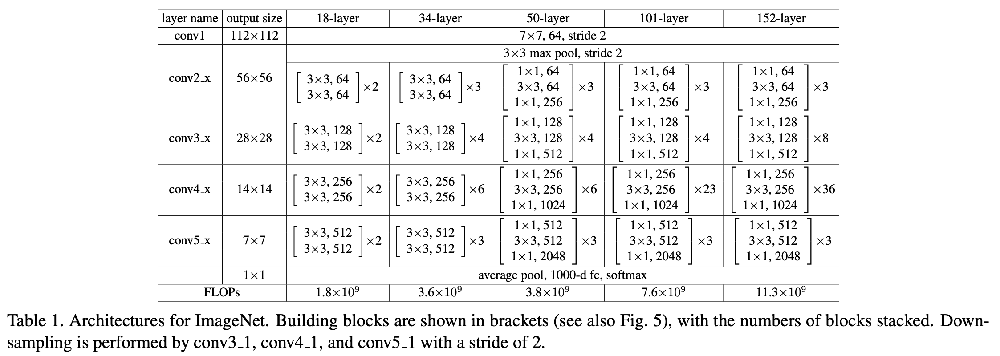

본 논문에서 발췌한 Table 1을 보면 알 수 있듯이, 34-layer 와 50-layer 은 기본적으로 동일한 conv1 부터 conv5_x 까지의 구조를 가지고 있습니다.

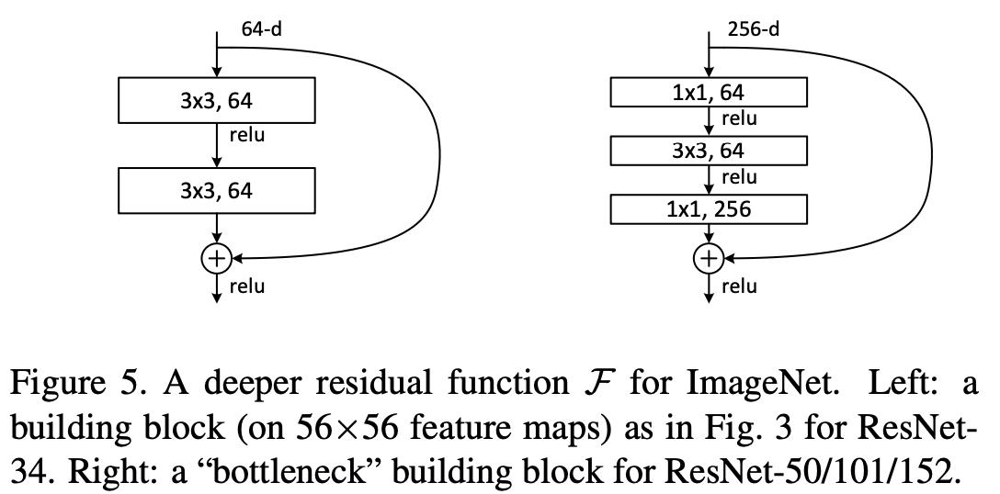

하지만 그 내부 구성을 살펴보면, 50-layer 이상인 구조에서는 오른쪽 그림과 같은 "bottleneck" 을 해결하기 위해 skip connection 구조를 사용하면서 34-layer 구조와 다르게, convN_x 마다 1x1 Convolution이 앞 뒤로 붙어 더 많은 레이어를 한 블록 내 가지고 있습니다.

- [ResNet-50](http://ethereon.github.io/netscope/#/gist/db945b393d40bfa26006)

### 2-1. `build_resnet_block` 동작 확인
---
- `input_layer` : shape는 (32, 32, 3)으로 사용

- 첫번재 블럭은 다음과 같이 설정
    - channel : 채널 수(64)
    - num_cnn : 한 블럭안에 있는 [Conv layer*2] 의 갯수
    - block_num : 블럭의 수 (0)

- 아래 주석문들을 해제해서 블럭단위로 쌓을 수 있습니다.

#### ㄱ. ResNet-34 : 블럭 생성 확인
---

In [4]:
resnet_input_layer = keras.layers.Input(shape=(32,32,3))   # 입력 레이어 생성

x = keras.layers.Conv2D(
        filters=64,
        kernel_size=(7,7),
        padding='same',
        strides=2,
        kernel_initializer='he_normal',
    )(resnet_input_layer)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Activation('relu')(x)
x = keras.layers.MaxPooling2D(
    pool_size=(2, 2), 
    strides=2
)(x)

resnet_block_output, CHECK_CHANNEL = build_resnet_block(x, 
                                                        channel=64, 
                                                        num_cnn=3, 
                                                        block_num=0)

# resnet_block_output, CHECK_CHANNEL = build_resnet_block(resnet_block_output,
#                                          channel=128,
#                                          num_cnn = 4,
#                                          block_num=1,CHECK_CHANNEL=CHECK_CHANNEL)

# resnet_block_output, CHECK_CHANNEL = build_resnet_block(resnet_block_output,
#                                          channel=256,
#                                          num_cnn = 6,
#                                          block_num=2,CHECK_CHANNEL=CHECK_CHANNEL)

# resnet_block_output, CHECK_CHANNEL = build_resnet_block(resnet_block_output,
#                                          channel=512,
#                                          num_cnn = 3,
#                                          block_num=3,CHECK_CHANNEL=CHECK_CHANNEL)

resnet_block_output = keras.layers.AveragePooling2D(pool_size=(1,1))(resnet_block_output)
resnet_block_output = keras.layers.Flatten(name='flatten')(resnet_block_output)
resnet_block_output = keras.layers.Dense(10, activation='softmax', name='predictions')(resnet_block_output)

In [5]:
# 블록 1개짜리 model 생성
model = keras.Model(inputs = resnet_input_layer, outputs = resnet_block_output)  

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 16, 16, 64)   9472        input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 16, 16, 64)   256         conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 16, 16, 64)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

#### ㄴ. ResNet-50 : 블럭 생성 확인
---

In [6]:
resnet_input_layer = keras.layers.Input(shape=(32,32,3))   # 입력 레이어 생성

x = keras.layers.Conv2D(
        filters=64,
        kernel_size=(7,7),
        padding='same',
        strides=2,
        kernel_initializer='he_normal',
    )(resnet_input_layer)
x = keras.layers.BatchNormalization()(x)
x = keras.layers.Activation('relu')(x)
x = keras.layers.MaxPooling2D(
    pool_size=(2,2), 
    strides=2
)(x)

resnet_block_output, CHECK_CHANNEL = build_resnet_block(x, 
                                                        channel=64, 
                                                        num_cnn=3, 
                                                        block_num=0,
                                                       is_50=True)

# resnet_block_output, CHECK_CHANNEL = build_resnet_block(resnet_block_output,
#                                          channel=128,
#                                          num_cnn = 4,
#                                          block_num=1,CHECK_CHANNEL=CHECK_CHANNEL,
#                                                        is_50=True)

# resnet_block_output, CHECK_CHANNEL = build_resnet_block(resnet_block_output,
#                                          channel=256,
#                                          num_cnn = 6,
#                                          block_num=2,CHECK_CHANNEL=CHECK_CHANNEL,
#                                                        is_50=True)

# resnet_block_output, CHECK_CHANNEL = build_resnet_block(resnet_block_output,
#                                          channel=512,
#                                          num_cnn = 3,
#                                          block_num=3,CHECK_CHANNEL=CHECK_CHANNEL,
#                                                        is_50=True)

resnet_block_output = keras.layers.AveragePooling2D(pool_size=(1,1))(resnet_block_output)
resnet_block_output = keras.layers.Flatten(name='flatten')(resnet_block_output)
resnet_block_output = keras.layers.Dense(10, activation='softmax', name='predictions')(resnet_block_output)

In [7]:
# 블록 1개짜리 model 생성
model = keras.Model(inputs=resnet_input_layer, outputs=resnet_block_output)  

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 16, 16, 64)   9472        input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 16, 16, 64)   256         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_10 (Activation)      (None, 16, 16, 64)   0           batch_normalization_1[0][0]      
____________________________________________________________________________________________

### 2.2 ResNet Build 하기 : `build_resnet`
---

- 입력 인자
    - `input_shape` : 입력 데이터의 shape
    - `num_cnn_list` : 각 블럭에서 cnn의 그룹(ResNet_34 = conv2, ResNet_50 = conv3)의 갯수가 담긴 list
    - `channel_list` : 각 블럭에서의 채널들이 담긴 list
    - `num_classes` : 분류할 모델의 class 수
    - `is_50` : 50과 34를 구분하는 boolean 변수
    - `plain` : ResNet과 PlainNet을 구분하는 boolean변수

In [8]:
# ResNet 모델 자체를 생성하는 함수입니다.
def build_resnet(input_shape=(32,32,3),
              num_cnn_list=[3, 4, 6, 3],
              channel_list=[64,128,256,512],
              num_classes=10,
                is_50=False,
                plain=False,):
    
    assert len(num_cnn_list) == len(channel_list) #모델을 만들기 전에 config list들이 같은 길이인지 확인합니다.
    
    input_layer = keras.layers.Input(shape=input_shape, name="input_layer")  # input layer를 만들어둡니다.
    output = input_layer # 뒤에서 사용하는 인자와 통일해주기 위해서 'output'이라고 한다
    
    output = keras.layers.Conv2D(
        filters=channel_list[0],
        kernel_size=(7,7),
        padding='same',
        strides=2,
        kernel_initializer='he_normal',
    )(output)
    output = keras.layers.BatchNormalization()(output)
    output = keras.layers.Activation('relu')(output)
    output = keras.layers.MaxPooling2D(
        pool_size=(2,2), 
        strides=2,
        name='stage2_0_maxpooling'
    )(output)
    
    cc = 64
    
    # config list들의 길이만큼 반복해서 블록을 생성합니다.
    for i, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
        output, cc = build_resnet_block(
            output,
            num_cnn=num_cnn, 
            channel=channel,
            block_num=i,
            is_50=is_50,
            CHECK_CHANNEL=cc,
            plain=plain
        )
        
    output = keras.layers.AveragePooling2D(pool_size=(1,1), name='avg_pool')(output)
    output = keras.layers.Flatten(name='flatten')(output)
    output = keras.layers.Dense(num_classes, activation='sigmoid', name='fc1000')(output)
    
    model = keras.Model(
        inputs=input_layer, 
        outputs=output
    )
    return model

In [9]:
# 기본값을 그대로 사용해서 ResNet-34모델을 building한다.
resnet_34 = build_resnet()

resnet_34.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_layer (InputLayer)        [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 16, 16, 64)   9472        input_layer[0][0]                
__________________________________________________________________________________________________
batch_normalization_2 (BatchNor (None, 16, 16, 64)   256         conv2d_2[0][0]                   
__________________________________________________________________________________________________
activation_23 (Activation)      (None, 16, 16, 64)   0           batch_normalization_2[0][0]      
____________________________________________________________________________________________

### 2-3. ResNet-50
---
- ResNet-34와 다른점

34-layer ResNet의 2-layer block을 3-layer bottleneck block으로 대체하여 50-layer ResNet을 구성합니다. (for. dimension matching)

즉, 위의 차이는 projection shortcut (dimension을 키워줄 때에만 사용) 을 사용하며 다른 모든 shortcut은 identity 합니다.

In [10]:
# 원하는 블록의 설계에 따라 매개변수로 리스트를 전달해 줍니다.
resnet_50 = build_resnet(
    num_cnn_list=[3, 4, 6, 3],
    channel_list=[64,128,256,512],
    is_50=True, 
)

resnet_50.summary()

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_layer (InputLayer)        [(None, 32, 32, 3)]  0                                            
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 16, 16, 64)   9472        input_layer[0][0]                
__________________________________________________________________________________________________
batch_normalization_3 (BatchNor (None, 16, 16, 64)   256         conv2d_3[0][0]                   
__________________________________________________________________________________________________
activation_72 (Activation)      (None, 16, 16, 64)   0           batch_normalization_3[0][0]      
____________________________________________________________________________________________

## 3. 일반 네트워크(plain network) 만들기
---
plain network는 앞에서 구현한 ResNet과 달리 shortcut connection이 없는 네트워크이므로 ResNet block에서 shortcut connection 부분만 제거해서 만들어 주도록 합니다.

In [6]:
def build_plain_block(input_layer,
                     num_cnn=3,
                     channel=64,
                     block_num=0,
                     is_50=True):
    
    x = input_layer
    
    # plain-50
    if is_50:
        for i in range(num_cnn):
            if block_num > 0 and i == 0:
                x = conv_block(x, channel, (1,1), strides=2)
                x = conv_block(x, channel, (3,3))
                x = conv_block(x, channel*4, (1,1))
            else:
                x = conv_block(x, channel, (1,1))
                x = conv_block(x, channel, (3,3))
                x = conv_block(x, channel*4, (1,1))
                
    # plain-34
    else:
        for i in range(num_cnn):
            if block_num > 0 and i == 0:
                x = conv_block(x, channel, (3,3), strides=2)
                x = conv_block(x, channel, (3,3))
            else:
                x = conv_block(x, channel, (3,3))
                x = conv_block(x, channel, (3,3))
    
    return x

In [7]:
def build_plainnet(input_shape=(32,32,3),
                  num_cnn_list=[3,4,6,3],
                  channel_list=[64,128,256,512],
                  num_classes=10,
                  is_50=True,
                  activation='softmax',
                  name='Plain_50'):
    
    assert len(num_cnn_list) == len(channel_list)
    
    input_layer = keras.layers.Input(shape=input_shape)
    
    x = conv_block(input_layer, 64, (7,7), strides=2)
    x = keras.layers.MaxPool2D(pool_size=(2,2), strides=2)(x)
    
    for block_num, (num_cnn, channel) in enumerate(zip(num_cnn_list, channel_list)):
        x = build_plain_block(x,
                             num_cnn=num_cnn,
                             channel=channel,
                             block_num=block_num,
                             is_50=is_50)
    
    x = keras.layers.GlobalAveragePooling2D()(x)
    x = keras.layers.Dense(num_classes,
                          activation=activation,
                          kernel_initializer='he_normal')(x)
    
    model = keras.Model(inputs=input_layer, outputs=x, name=name)
    
    return model

## 4. ResNet-50 vs Plain-50 또는 ResNet-34 vs Plain-34

### 4-1. Ablation Study
---
ResNet-34 vs Plain-34 또는 ResNet-50 vs Plain-50 에 대해서 학습을 진행해 봅니다. 그리고 결과를 비교해 봅시다!

ResNet은 많은 레이어와 Pooling을 거치므로 CIFAR-10에서는 오버피팅(overfitting)으로 잘 동작하지 않을 수 있습니다.

레이어가 많고 학습해야 할 변수(parameter)가 많은 데 비해, 데이터 수가 많지 않기 때문입니다.

노드 내에서 tensorflow-datasets에서 제공하는 cats_vs_dogs 데이터셋을 추천 받아서 cats_vs_dogs 데이터를 활용해서 진행해 보도록 하겠습니다.

### 1) cats_vs_dogs 데이터셋 불러오기
---
- tensorflow-datasets에서 제공하는 `cats_vs_dogs` 데이터셋를 사용하여 진행해 보도록 하겠습니다.
- `ds_train`, `ds_valid`, `ds_test`를 8:1:1의 비율로 나누어 보도록 하겠습니다.
- ds_info.feature 확인하도록 하겠습니다.

In [34]:
import urllib3
urllib3.disable_warnings()

# tfds.disable_progress_bar() # 이 주석을 풀면 데이터셋 다운로드 과정의 프로그레스바가 나타나지 않습니다.

(ds_train, ds_valid), ds_info = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:]'],
    as_supervised=True,
    shuffle_files=True,
    with_info=True)

In [35]:
# cats_vs_dogs 데이터셋에 대한 정보 확인
ds_info

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.0',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_path='/aiffel/tensorflow_datasets/cats_vs_dogs/4.0.0',
    download_size=786.68 MiB,
    dataset_size=689.64 MiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=8>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    title = {Asirra: A CAPTCHA tha

In [36]:
# Tensorflow 데이터셋을 로드하면 꼭 feature 정보를 확인해 보세요. 
print(ds_info.features)

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=tf.uint8),
    'image/filename': Text(shape=(), dtype=tf.string),
    'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
})


In [37]:
# 데이터의 개수도 확인해 봅시다.
print(tf.data.experimental.cardinality(ds_train))
print(tf.data.experimental.cardinality(ds_test))

tf.Tensor(18610, shape=(), dtype=int64)
tf.Tensor(-1, shape=(), dtype=int64)


### 2) Input Normalization
---

Data Normalization 은 데이터의 범위를 사용자가 원하는 범위로 제한하는 것입니다.

이미지 데이터의 경우 픽셀 정보를 0 ~ 255 사이의 값으로 가지는데,

이를 255로 나누어주면 0 ~ 1.0 사이의 값을 가지게 될 것입니다.

위의 예를 수식으로 간단하게 쓴다면, (정규화하고자 하는 값 - 데이터 값들 중 최소값) / (데이터 값들 중 최대값 - 데이터 값들 중 최소값) 이라고 할 수 있습니다.
 
Data Normalization을 하는 이유는 머신러닝에서 scale이 큰 feature의 영향이 비대해지는 것을 방지하고, 딥러닝에서 Local optimum에 빠질 위험 감소(즉, 학습 속도 향상) 시키는 것입니다.

아래 그림을 보면 왼쪽이 정규화 하지 않은 경우의 Cost function 이고 오른쪽이 정규화 한 Cost function 일 때, 정규화 한 경우가 Local optimum 에서 더 빨리 빠져나올 수 있다는 것을 직관적으로 이해할 수 있다.그리고 scikit-learn에서 MinMaxScaler로 쉽게 사용 할 수 있습니다.

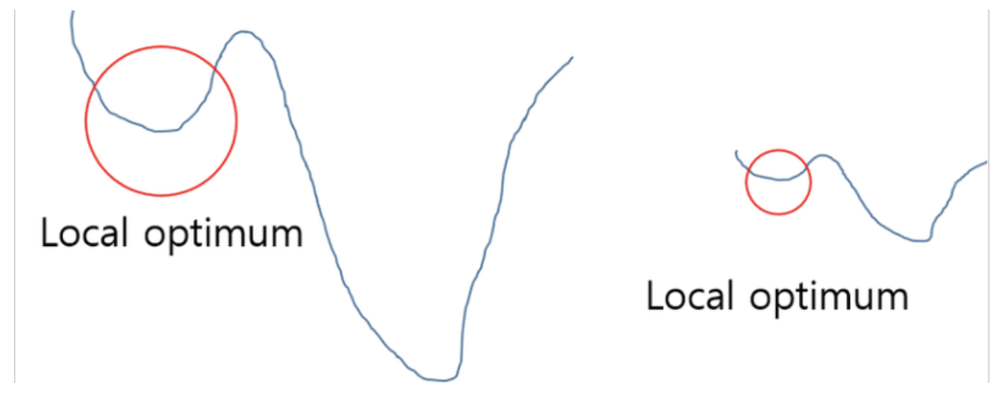

그러므로, 모델에 넣어주기 전에는 각 채널별 최댓값인 255로 정규화(normalize)를 해주어 이미지의 표현이 0과 1 사이로 들어오도록 만들어주도록 하겠습니다.

In [48]:
def normalize_and_resize_img(image, label):
    """Normalizes images: `uint8` -> `float32`."""
    image = tf.image.resize(image, (224,224))
    image = tf.cast(image, tf.float32) / 255.
    return image, label

# 노드에 있던 코드
# def normalize_and_resize_img(image, label):
#     """Normalizes images: `uint8` -> `float32`."""
#     # image = tf.image.resize(image, [32, 32])
#     return tf.cast(image, tf.float32) / 255., label

In [49]:
def apply_normalize_on_dataset(ds, is_test=False, batch_size=16):
    ds = ds.map(
        normalize_and_resize_img, 
        num_parallel_calls=1
    )
    ds = ds.batch(batch_size)
    if not is_test:
        ds = ds.repeat()
        ds = ds.shuffle(200)
    #ds = ds.prefetch(tf.data.experimental.AUTOTUNE)
    return ds

In [38]:
ds_info.features["label"].num_classes

2

In [39]:
ds_info.features["label"].names

['cat', 'dog']

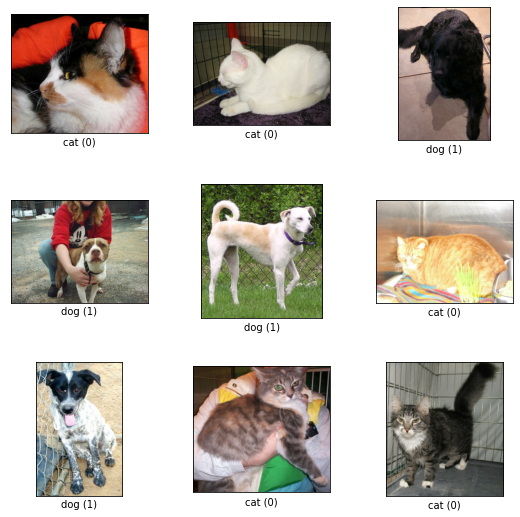

In [40]:
fig = tfds.show_examples(ds_train, ds_info)

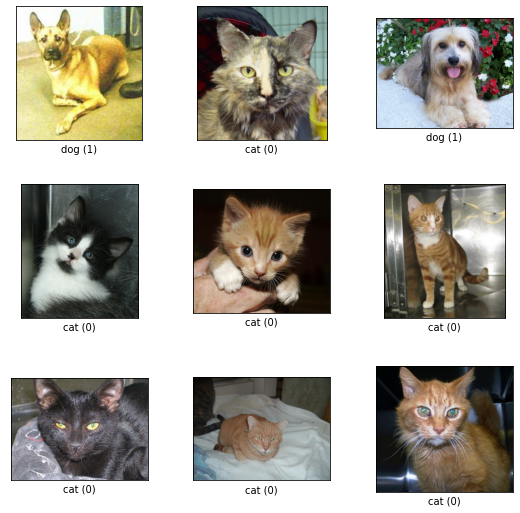

In [43]:
fig = tfds.show_examples(ds_valid, ds_info)

In [44]:
# 데이터셋에서 데이터 하나 뽑아봅니다.
img = next(iter(ds_train))

In [45]:
# 라벨 값을 출력해 봅니다.
# 0 = 고양이, 1 = 개
img[1]

<tf.Tensor: shape=(), dtype=int64, numpy=0>

(500, 340, 3)


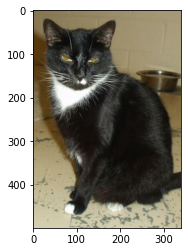

In [46]:
# 이미지 시각화
print(img[0].shape)
plt.imshow(img[0])
plt.show()

In [47]:
# 데이터의 개수도 확인해 봅시다. 
ds_train_len = 18610
ds_valid_len = 2326
ds_test_len = 2326

print(ds_train_len)
print(ds_valid_len)
print(ds_test_len)

18610
2326
2326


#### 'cats_vs_dogs' 데이터 구성 확인

- ds_train에는 2가지의 정보가 존재합니다.
    
    - 이미지는 0(고양이), 1(개) 로 구성되어 있습니다.
    
- 총 23262개의 데이터가 존재 하며 아래와 같이 나눠 보도록 하겠습니다.
    - ds_train : 18610
    - ds_valid : 2326
    - ds_test : 2326

### 3) 그래프 비교함수 (plot_loss_graph, plot_acc_graph) 정의

- loss, accuracy 비교를 위한 비교 함수를 만들어줍니다.

In [71]:
# loss 비교를 시각화 하기 위한 비교 함수 정의
def plot_loss_graph(res, pla, num) :
    plt.plot(res.history['loss'], 'r')
    plt.plot(pla.history['loss'], 'b')
    plt.title('Model training loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['ResNet_'+str(num), 'Plain_'+str(num)], loc='upper left')
    plt.show()

In [72]:
# accuracy 비교를 시각화 하기 위한 비교 함수 정의
def plot_acc_graph(res, pla, num) :
    plt.plot(res.history['val_accuracy'], 'r')
    plt.plot(pla.history['val_accuracy'], 'b')
    plt.title('Model validation accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['ResNet_'+str(num), 'Plain_'+str(num)], loc='upper left')
    plt.show()

### 4) 모델 학습 & 결과 시각화

input_shape를 (224, 224, 3)으로 하여서 위 4가지 모델을 새로 생성 후 학습을 진행

In [50]:
ds_train = apply_normalize_on_dataset(ds_train, is_test=False, batch_size=BATCH_SIZE)

In [51]:
ds_valid = apply_normalize_on_dataset(ds_valid, is_test=False, batch_size=BATCH_SIZE)

In [52]:
BATCH_SIZE = 16
EPOCH = 10

In [55]:
INPUT_SHAPE = (224, 224, 3)

### 4-1) 34-layer 비교 (Resnet_34 vs Plain_34)

#### ㄱ. Resnet_34

In [56]:
# 위에서 구현한 resnet_34 모델 구현을 summary로 확인
resnet_34 = build_resnet(input_shape=INPUT_SHAPE,
    num_cnn_list=[3, 4, 6, 3],
    channel_list=[64, 128, 256, 512],
    num_classes=1,
    is_50=False,
    plain=False,)

resnet_34.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_layer (InputLayer)        [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 112, 112, 64) 9472        input_layer[0][0]                
__________________________________________________________________________________________________
batch_normalization_5 (BatchNor (None, 112, 112, 64) 256         conv2d_5[0][0]                   
__________________________________________________________________________________________________
activation_186 (Activation)     (None, 112, 112, 64) 0           batch_normalization_5[0][0]      
____________________________________________________________________________________________

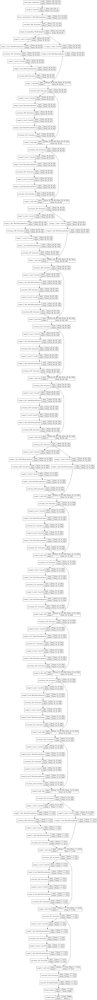

In [57]:
# resnet_34 모델의 진행과정 출력
tf.keras.utils.plot_model(resnet_34, to_file='./resnet_34.png', show_shapes=True)

In [58]:
# resnet_34 모델 학습
resnet_34.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=0.001), #, clipnorm=1.),
    metrics=['accuracy'],
)

res_history_34 = resnet_34.fit(
    ds_train,
    steps_per_epoch=int(ds_train_len/BATCH_SIZE),
    validation_steps=int(ds_test_len/BATCH_SIZE),
    epochs=EPOCH,
    validation_data=ds_valid,
    verbose=1,
#     use_multiprocessing=True,
)

Epoch 1/10
1163/1163 [==============================] - 300s 239ms/step - loss: 2.7393 - accuracy: 0.5326 - val_loss: 0.7480 - val_accuracy: 0.5514
Epoch 2/10
1163/1163 [==============================] - 285s 245ms/step - loss: 0.8467 - accuracy: 0.6209 - val_loss: 0.7227 - val_accuracy: 0.5754
Epoch 3/10
1163/1163 [==============================] - 269s 231ms/step - loss: 0.7041 - accuracy: 0.6203 - val_loss: 0.7399 - val_accuracy: 0.6358
Epoch 4/10
1163/1163 [==============================] - 269s 231ms/step - loss: 0.6149 - accuracy: 0.6866 - val_loss: 0.5503 - val_accuracy: 0.7134
Epoch 5/10
1163/1163 [==============================] - 269s 231ms/step - loss: 0.5458 - accuracy: 0.7223 - val_loss: 1.6586 - val_accuracy: 0.6901
Epoch 6/10
1163/1163 [==============================] - 269s 231ms/step - loss: 0.6263 - accuracy: 0.6997 - val_loss: 0.8781 - val_accuracy: 0.5953
Epoch 7/10
1163/1163 [==============================] - 269s 231ms/step - loss: 0.5191 - accuracy: 0.7485 - val_

#### ㄴ. Plain_34

In [59]:
# 위에서 구현한 plain_34 모델 구현을 summary로 확인
plain_34 = build_resnet(input_shape=INPUT_SHAPE,
    num_cnn_list=[3, 4, 6, 3],
    channel_list=[64, 128, 256, 512],
    num_classes=1,
    is_50=False,
    plain=True,)

plain_34.summary()

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 112, 112, 64)      9472      
_________________________________________________________________
batch_normalization_6 (Batch (None, 112, 112, 64)      256       
_________________________________________________________________
activation_235 (Activation)  (None, 112, 112, 64)      0         
_________________________________________________________________
stage2_0_maxpooling (MaxPool (None, 56, 56, 64)        0         
_________________________________________________________________
stage2_1_conv1 (Conv2D)      (None, 56, 56, 64)        36928     
_________________________________________________________________
stage2_1_bn1 (BatchNormaliza (None, 56, 56, 64)        256 

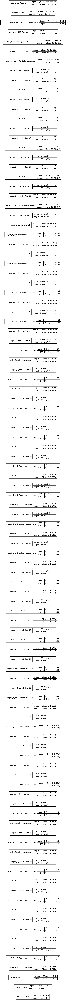

In [60]:
# plain_34 모델의 진행과정 출력
tf.keras.utils.plot_model(plain_34, to_file='./plain_34.png', show_shapes=True)

In [61]:
# plain_34 모델 학습
plain_34.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=0.001), #, clipnorm=1.),
    metrics=['accuracy'],
)

pla_history_34 = plain_34.fit(
    ds_train,
    steps_per_epoch=int(ds_train_len/BATCH_SIZE),
    validation_steps=int(ds_test_len/BATCH_SIZE),
    epochs=EPOCH,
    validation_data=ds_valid,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/10
1163/1163 [==============================] - 223s 165ms/step - loss: 0.7516 - accuracy: 0.5292 - val_loss: 0.6828 - val_accuracy: 0.6405
Epoch 2/10
1163/1163 [==============================] - 178s 153ms/step - loss: 0.6637 - accuracy: 0.6115 - val_loss: 0.6268 - val_accuracy: 0.6455
Epoch 3/10
1163/1163 [==============================] - 168s 145ms/step - loss: 0.6384 - accuracy: 0.6420 - val_loss: 2.1641 - val_accuracy: 0.5194
Epoch 4/10
1163/1163 [==============================] - 169s 145ms/step - loss: 0.6951 - accuracy: 0.5310 - val_loss: 11.2998 - val_accuracy: 0.5160
Epoch 5/10
1163/1163 [==============================] - 169s 145ms/step - loss: 0.6984 - accuracy: 0.5164 - val_loss: 0.7383 - val_accuracy: 0.5116
Epoch 6/10
1163/1163 [==============================] - 169s 146ms/step - loss: 0.6937 - accuracy: 0.5524 - val_loss: 0.6799 - val_accuracy: 0.5750
Epoch 7/10
1163/1163 [==============================] - 170s 146ms/step - loss: 0.6916 - accuracy: 0.5451 - val

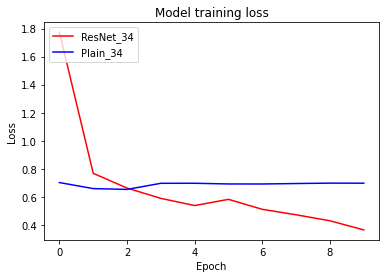

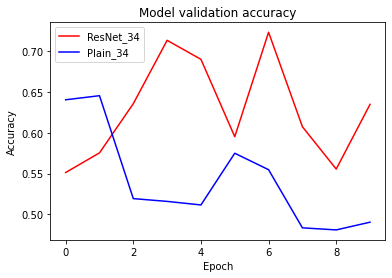

In [73]:
# resnet_34 vs plain_34 모델 학습 결과 시각화
plot_loss_graph(res_history_34, pla_history_34, 34)
plot_acc_graph(res_history_34, pla_history_34, 34)

#### ㄷ. 시각화 결과 정리

- Model training loss를 보면 Plain_34는 epoch 에 따라 변동 없이 0.6 ~ 0.8 사이의 값을 값지만, ResNer_34 는 epoch 초반은 1.8 정도의 값을 가지기는 했지만, 후반으로 갈수록 0.4에 수렴 함을 보면, Plain 보다 ResNet을 사용할 때 train loss를 더 잘 잡음을 확인 할 수 있었습니다.

- epoch 수가 낮아서 확실하게 말하기는 조금 애매하긴 하지만, Model validation accuracy를 보면 Plain_34보다는 ResNet_34 가 더 높은 accuracy를 보임을 확인 할 수 있었습니다.

### 4-2) 50-layer 비교 (Resnet_50 vs Plain_50)

#### ㄱ. Resnet_50

In [63]:
# 위에서 구현한 resnet_50 모델 구현을 summary로 확인
resnet_50 = build_resnet(input_shape=INPUT_SHAPE,
    num_cnn_list=[3, 4, 6, 3],
    channel_list=[64, 128, 256, 512],
    num_classes=1,
    is_50=True,
    plain=False,)

resnet_50.summary()

Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_layer (InputLayer)        [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_7 (Conv2D)               (None, 112, 112, 64) 9472        input_layer[0][0]                
__________________________________________________________________________________________________
batch_normalization_7 (BatchNor (None, 112, 112, 64) 256         conv2d_7[0][0]                   
__________________________________________________________________________________________________
activation_268 (Activation)     (None, 112, 112, 64) 0           batch_normalization_7[0][0]      
____________________________________________________________________________________________

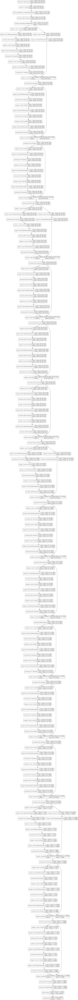

In [64]:
# resnet_50 모델의 진행과정 출력
tf.keras.utils.plot_model(resnet_50, to_file='./resnet_50.png', show_shapes=True)

In [65]:
# resnet_50 모델 학습
resnet_50.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=0.001), #, clipnorm=1.),
    metrics=['accuracy'],
)

res_history_50 = resnet_50.fit(
    ds_train,
    steps_per_epoch=int(ds_train_len/BATCH_SIZE),
    validation_steps=int(ds_test_len/BATCH_SIZE),
    epochs=EPOCH,
    validation_data=ds_valid,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/10
1163/1163 [==============================] - 512s 412ms/step - loss: 4.9977 - accuracy: 0.5201 - val_loss: 17.1521 - val_accuracy: 0.5155
Epoch 2/10
1163/1163 [==============================] - 453s 390ms/step - loss: 1.2988 - accuracy: 0.5650 - val_loss: 46.2861 - val_accuracy: 0.4862
Epoch 3/10
1163/1163 [==============================] - 453s 390ms/step - loss: 0.8718 - accuracy: 0.6259 - val_loss: 0.6026 - val_accuracy: 0.6694
Epoch 4/10
1163/1163 [==============================] - 453s 389ms/step - loss: 0.6681 - accuracy: 0.6800 - val_loss: 0.7041 - val_accuracy: 0.6711
Epoch 5/10
1163/1163 [==============================] - 453s 390ms/step - loss: 0.6196 - accuracy: 0.7043 - val_loss: 32.9415 - val_accuracy: 0.5504
Epoch 6/10
1163/1163 [==============================] - 463s 398ms/step - loss: 0.6494 - accuracy: 0.7013 - val_loss: 1.4555 - val_accuracy: 0.5877
Epoch 7/10
1163/1163 [==============================] - 452s 389ms/step - loss: 0.5875 - accuracy: 0.7219 - v

#### ㄴ. Plain_50

In [66]:
# 위에서 구현한 plain_50 모델 구현을 summary로 확인
plain_50 = build_resnet(input_shape=INPUT_SHAPE,
    num_cnn_list=[3, 4, 6, 3],
    channel_list=[64, 128, 256, 512],
    num_classes=1,
    is_50=True,
    plain=True,)

plain_50.summary()

Model: "model_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_layer (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 112, 112, 64)      9472      
_________________________________________________________________
batch_normalization_8 (Batch (None, 112, 112, 64)      256       
_________________________________________________________________
activation_333 (Activation)  (None, 112, 112, 64)      0         
_________________________________________________________________
stage2_0_maxpooling (MaxPool (None, 56, 56, 64)        0         
_________________________________________________________________
stage2_1_conv1 (Conv2D)      (None, 56, 56, 64)        4160      
_________________________________________________________________
stage2_1_bn1 (BatchNormaliza (None, 56, 56, 64)        256 

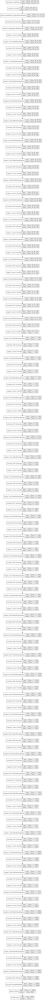

In [67]:
# plain_50 모델의 진행과정 출력
tf.keras.utils.plot_model(plain_50, to_file='./plain_50.png', show_shapes=True)

In [68]:
# plain_50 모델 학습
plain_50.compile(
    loss='binary_crossentropy',
    optimizer=tf.keras.optimizers.Adam(lr=0.001), #, clipnorm=1.),
    metrics=['accuracy'],
)

pla_history_50 = plain_50.fit(
    ds_train,
    steps_per_epoch=int(ds_train_len/BATCH_SIZE),
    validation_steps=int(ds_test_len/BATCH_SIZE),
    epochs=EPOCH,
    validation_data=ds_valid,
    verbose=1,
    use_multiprocessing=True,
)

Epoch 1/10
1163/1163 [==============================] - 242s 181ms/step - loss: 0.8062 - accuracy: 0.5080 - val_loss: 1.1168 - val_accuracy: 0.4849
Epoch 2/10
1163/1163 [==============================] - 233s 200ms/step - loss: 0.7310 - accuracy: 0.5112 - val_loss: 0.7092 - val_accuracy: 0.4905
Epoch 3/10
1163/1163 [==============================] - 222s 191ms/step - loss: 0.7161 - accuracy: 0.5031 - val_loss: 1.7639 - val_accuracy: 0.4922
Epoch 4/10
1163/1163 [==============================] - 210s 181ms/step - loss: 0.7243 - accuracy: 0.5009 - val_loss: 0.7998 - val_accuracy: 0.5155
Epoch 5/10
1163/1163 [==============================] - 210s 181ms/step - loss: 0.7150 - accuracy: 0.5012 - val_loss: 0.7000 - val_accuracy: 0.5022
Epoch 6/10
1163/1163 [==============================] - 210s 181ms/step - loss: 0.7125 - accuracy: 0.5066 - val_loss: 1.0247 - val_accuracy: 0.4931
Epoch 7/10
1163/1163 [==============================] - 210s 181ms/step - loss: 0.7202 - accuracy: 0.4962 - val_

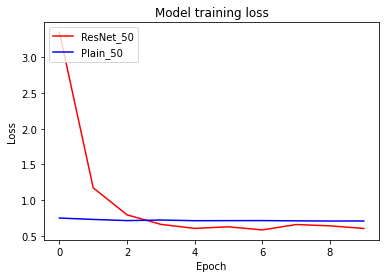

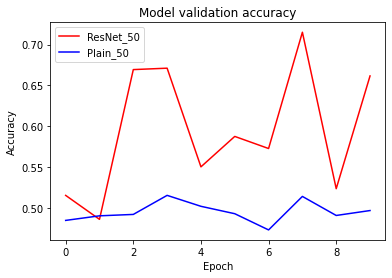

In [74]:
# resnet_50 vs plain_50 모델 학습 결과 시각화
plot_loss_graph(res_history_50, pla_history_50, 50)
plot_acc_graph(res_history_50, pla_history_50, 50)

#### ㄷ. 시각화 결과 정리

- Model training loss를 보면 Plain_50는 epoch 에 따라 변동 없이 0.5 ~ 1.0 사이의 값을 값지만, ResNer_50 는 epoch 초반은 3.0 이상의 값을 가지기는 했지만, 후반으로 갈수록 Plain_50보다 낮은 training loss 값에 수렴 함을 보면, Plain 보다 ResNet을 사용할 때 train loss를 더 잘 잡음을 확인 할 수 있었습니다.

- epoch 수가 낮아서 확실하게 말하기는 조금 애매하긴 하지만, Model validation accuracy를 보면 Plain_50 보다는 ResNet_50 가 더 높은 accuracy를 보임을 확인 할 수 있었습니다.

## 5. 루브릭 & 회고 & References


### 루브릭
---

1. ResNet-34, ResNet-50 모델 구현이 정상적으로 진행되었는가?

- 블록함수 구현이 제대로 진행되었으며 구현한 모델의 summary가 예상된 형태로 출력되었다.

2. 구현한 ResNet 모델을 활용하여 Image Classification 모델 훈련이 가능한가?

- cats_vs_dogs 데이터셋으로 학습시 몇 epoch동안 안정적으로 loss 감소가 진행 확인되었다.

3. Ablation Study 결과가 바른 포맷으로 제출되었는가?

- ResNet-34, ResNet-50 각각 plain모델과 residual모델을 동일한 epoch만큼 학습시켰을 때의 validation accuracy 기준으로 Ablation Study 결과표가 작성되었다.

### 회고
---

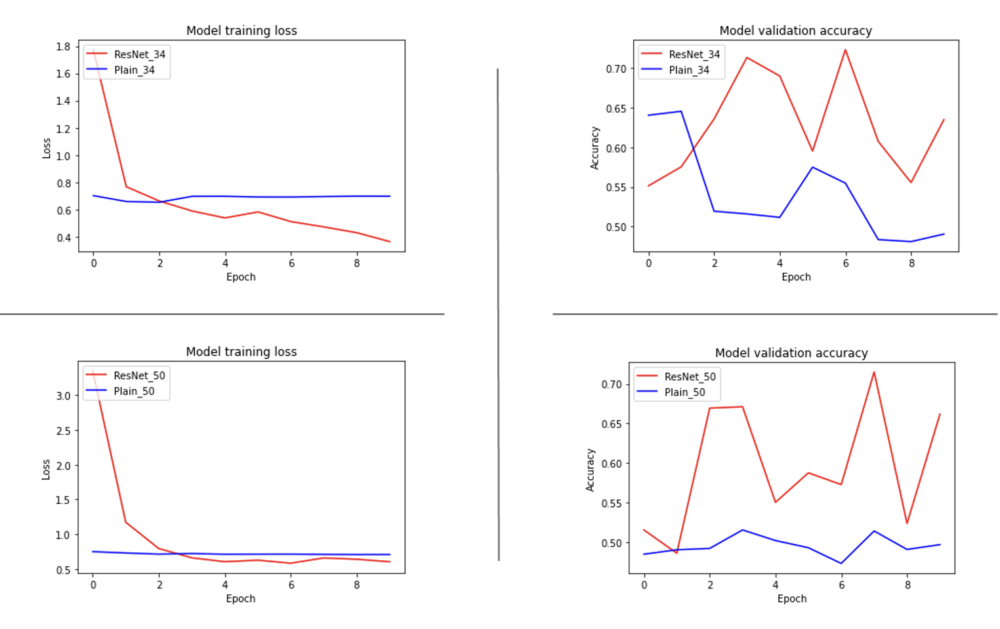

- 위 이미지를 통해서 알 수 있듯이, [논문](https://arxiv.org/pdf/1512.03385.pdf)에서 나와 있던대로 Plain CNN에서는 layer가 깊어질 수록 error가 높다 (= accuracy 가 낮다)는 사실을 확인 할 수 있었으며, 또한, ResNet CNN에서는 layer가 깊음에도 불구하고 error 가 낮아진다 (= accuracy가 높다)는 것을 확인 할 수 있었습니다.

- 이번 프로젝트은 2주라는 생각보다 널널한 시간이 주어져서 개인적으로 충분한 시간을 주었구나, 라고 생각을 했었지만 그것은 저의 오만이었다고 생각을 하게 만들어준 프로젝트라고 생각을 합니다.

- 우선, 논문을 읽어보자는 생각으로 무지성으로 번역을 하는 과정을 거치기도 하고, 번역을 해보았으나 논문에 대한 이해도가 부족하다고 느껴, 논문에 대한 리뷰 블로그와 유튜브까지 ResNet에 대한 이해도를 높여 보려고 하는 시간으로 약 1주일 이상의 시간을 보냈습니다.

- 원래 목표한 바는 ResNet 코드 구현을 홀로 힘으로 진행하는 것으로 하였으나, 아쉽게도 그것을 진행하지는 못 하였습니다.

- 개인적으로 논문의 내용을 이해한 것과 이해한 내용을 코드로 구현하는 것 차이에서 큰 거리감을 느껴서 구현을 위한 아이디어를 얻고자 다른 분들이 구현한 코드를 참고를 하는 과정을 거치긴 하였으나, 나홀로 코드를 작성하여 완성하지는 못하고 다른 분들이 완성한 코드를 참고하고 거기에 본인의 생각을 첨부하는 과정을 통해서 완성할 수 있었던 프로젝트였다고 생각합니다.

- Going Deeper 과정이 어려울 것이라고 생각하였으나, 생각보다 난이도가 높아서 어려움을 느꼈지만 그만큼 배우는 것도 많았던 프로젝트 였던 것 같습니다.

### References
---

- [Deep Residual Learning for Image Recognition](https://arxiv.org/pdf/1512.03385.pdf)
- [무지성 번역](https://modulabs.notion.site/Deep-Residual-Learning-for-Image-Recognition-4ccd7cdfd84141a4abaa55c311bb0928)
- [논문 이해를 위해 참고한 블로그](https://phil-baek.tistory.com/entry/ResNet-Deep-Residual-Learning-for-Image-Recognition-%EB%85%BC%EB%AC%B8-%EB%A6%AC%EB%B7%B0)
- [동빈좌 ResNet 유튜브](https://www.youtube.com/watch?v=671BsKl8d0E)
- [ResNet-50 구조 참고자료](http://ethereon.github.io/netscope/#/gist/db945b393d40bfa26006)
- [프로젝트 진행에 코드를 참고한 노트북 1](https://github.com/ljh415/AIFFEL/blob/master/Going_Deeper/01.ResNet_Ablation_Study/ResNet_Ablation_Study.ipynb)
- [프로젝트 진행에 코드를 참고한 노트북 2](https://github.com/jjun9288/AIFFEL/blob/master/Going%20Deeper/1.backbone/3.ResNet_implementation.ipynb)
- [프로젝트 진행에 코드를 참고한 노트북 3](https://github.com/qsdcfd/AIFFEL/blob/TIL/Personal-Project/Going%20Deeper%20(CV)/Going%20Deeper%2001/%5BGD-01%5DResNet.sehyun.ipynb)